<a href="https://colab.research.google.com/github/freida20git/nanoparticle-classification/blob/main/triangles/triangles_yolo_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

3 types of detections

data1: cubes, pyramids,

data2: triangles, circle, truncated

data3: dots, other


the bounding box is the whole picture

In [ ]:
'''
data looks like: (each - is a sub directory)

triangles:

-triangles_full_images:
--train:
---triangles_train1.jpg
---triangles_train2.jpg
---triangles_train3.jpg
---triangles_train4.jpg
--validation:
---triangles_valid1.jpg
---triangles_valid2.jpg
--test:
---triangles_test.jpg

# clssified data bboxes:

-triangles_data:
--train:
---triangle:
---truncated:
----triangle_train3_360_201_418_239.jpg
---circle:
--validation:
---triangle:
---truncated:
----triangle_train#_x1_y1_x2_y2.jpg
---circle:
--test:
---triangle:
---truncated:
----triangle_train#_x1_y1_x2_y2.jpg
---circle:
'''

In [ ]:
# ORIGINAL FOLDER :
'''
!gdown --folder "https://drive.google.com/drive/folders/1wI0TxEccoLLZ2M7LSYJX88HF6klQiApZ?usp=sharing"
!gdown --folder "https://drive.google.com/drive/folders/1YpOsCSXkNe3gMmHK98FGKm187aIGlCFf?usp=sharing"

'''

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

In [ ]:
!gdown --folder 1NrA-p4k9URB6GhS85Chtimb_48KQWr09

In [ ]:
!pip install ultralytics

In [6]:
import os
import shutil
import cv2
from PIL import Image
from IPython.display import Image as IPyImage
from matplotlib import pyplot as plt
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [7]:
# Map class names to YOLO class IDs
CLASS_MAP = {
    "circle": 0,
    "triangle": 1,
    "truncated": 2
}

# Edit images:

In [ ]:
def copy_and_prefix_images_to_yolo_structure(src_base_dir, dst_base_dir):
    """
    Copies image files into YOLO-style structure:
    dst_base_dir/split/images/
    Adds class name as a prefix to each filename.
    """
    for split in ['train', 'validation', 'test']:
        dst_images_dir = os.path.join(dst_base_dir, split, 'images')
        os.makedirs(dst_images_dir, exist_ok=True)

        for cls in CLASS_MAP.keys():
            src_folder = os.path.join(src_base_dir, split, cls)
            if os.path.exists(src_folder):
                for filename in os.listdir(src_folder):
                    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
                        # Add class prefix to filename
                        new_filename = f"{cls}_{filename}"
                        src_path = os.path.join(src_folder, filename)
                        dst_path = os.path.join(dst_images_dir, new_filename)
                        shutil.copy2(src_path, dst_path)

# Example usage
src_directory = '/content/drive/MyDrive/triangles_project/triangle_truncated_circle_small'
dst_directory = '/content/drive/MyDrive/triangles_project/yolo_data'

copy_and_prefix_images_to_yolo_structure(src_directory, dst_directory)
print("✅ All images copied with class prefix to YOLO-style structure.")


✅ All images copied with class prefix to YOLO-style structure.


In [ ]:
def find_image_sizes(base_dir):
    image_dict={}
    try:
      for i in os.listdir(base_dir):
          for j in os.listdir(os.path.join(base_dir,i)):
            print(j)
            image_path=os.path.join(base_dir,i,j)
            with Image.open(image_path) as img:
                width, height = img.size
              #  name=j[len(base_dir)+1:]
                name= os.path.splitext(j)[0]
                image_dict[name]=(width,height)
                print("Image:", j)
                print(f"Size: {width}x{height}")
      return image_dict
    except FileNotFoundError:
        print("Error: Image file not found.")
    except Exception as e:
        print(f"An error occurred: {e}")

In [ ]:
ORIGINAL_IMAGE_SIZES=find_image_sizes('/content/drive/MyDrive/triangles_project/triangles_full_images')

triangles_test.jpg
Image: triangles_test.jpg
Size: 1006x921
triangles_train1.jpg
Image: triangles_train1.jpg
Size: 485x412
triangles_train2.jpg
Image: triangles_train2.jpg
Size: 1389x628
triangles_train3.jpg
Image: triangles_train3.jpg
Size: 482x845
triangles_valid1.jpg
Image: triangles_valid1.jpg
Size: 1024x1024
triangles_valid2.png
Image: triangles_valid2.png
Size: 1536x1024
triangles_valid2_bboxes.png
Image: triangles_valid2_bboxes.png
Size: 1536x1024
triangles_valid1_bboxes.jpg
Image: triangles_valid1_bboxes.jpg
Size: 1024x1024
triangles_valid1_bboxes.png
Image: triangles_valid1_bboxes.png
Size: 1024x1024
valid1_all_bboxes.png
Image: valid1_all_bboxes.png
Size: 1024x1024
valid2_all_bboxes.png
Image: valid2_all_bboxes.png
Size: 1536x1024


In [ ]:
ORIGINAL_IMAGE_SIZES= {'triangles_test': (1006, 921), 'triangles_train1': (485, 412), 'triangles_train2': (1389, 628), 'triangles_train3': (482, 845), 'triangles_valid1': (1024, 1024), 'triangles_valid2': (1536, 1024), 'triangles_valid2_bboxes': (1536, 1024), 'triangles_valid1_bboxes': (1024, 1024), 'valid1_all_bboxes': (1024, 1024), 'valid2_all_bboxes': (1536, 1024)}

In [ ]:
print(ORIGINAL_IMAGE_SIZES)

{'triangles_test': (1006, 921), 'triangles_train1': (485, 412), 'triangles_train2': (1389, 628), 'triangles_train3': (482, 845), 'triangles_valid1': (1024, 1024), 'triangles_valid2': (1536, 1024), 'triangles_valid2_bboxes': (1536, 1024), 'triangles_valid1_bboxes': (1024, 1024), 'valid1_all_bboxes': (1024, 1024), 'valid2_all_bboxes': (1536, 1024)}


In [ ]:
def create_yolo_labels_single_file(image_dir, base_dir):
    # Prepare detections per split
    detections_per_split = {
        'train': {},
        'valid': {},
        'test': {}
    }

    for filename in os.listdir(image_dir):
        if not filename.endswith(('.jpg', '.png')):
            continue

        name_parts = filename.split('.')[0].split('_')
        # Check for the expected minimum number of parts
        if len(name_parts) < 7:
             print(f"Skipping invalid filename format: {filename}")
             continue


        cls_name = name_parts[0]
        # Split ID is usually the 3rd part (index 2)
        split_id_part = name_parts[2]
        split = ''.join(filter(str.isalpha, split_id_part)) # Extract the alphabetic part (train, valid, test)
        image_id = f"triangles_{split_id_part}" # Use the full split ID (e.g., train1) as the key

        class_id = CLASS_MAP.get(cls_name, -1)
        if class_id == -1:
            print(f"Unknown class '{cls_name}' in filename: {filename}")
            continue

        try:
            # Determine the starting index for bounding box coordinates
            # It seems there might be an extra part like 'face' in some filenames
            # We need to find where the numeric coordinates start
            bbox_start_index = -4 # Assuming the last 4 parts are bbox coordinates

           # filename = f"{original_img_forFileName}_{x1}_{y1}_{x2}_{y2}.jpg"
           # xy1 = left bottom point
           # xy2 = right top point

            # Extract and convert bounding box coordinates
            x1 = int(name_parts[bbox_start_index])
            y1 = int(name_parts[bbox_start_index + 1])
            x2 = int(name_parts[bbox_start_index + 2])
            y2 = int(name_parts[bbox_start_index + 3])

            # Ensure bounding box coordinates are valid
            if x1 >= x2 or y1 >= y2:
                 print(f"Invalid bounding box dimensions (x1 >= x2 or y2 >= y1) for image '{image_id}': {filename}")
                 continue

            if image_id not in ORIGINAL_IMAGE_SIZES:
                print(f"Unknown image key '{image_id}' in filename: {filename}")
                continue


        except (ValueError, IndexError) as e :
            print(f"Invalid bbox values or filename format in {filename}: {e}")
            continue
        except KeyError as e:
             print(f"Missing image size data for key {e} in filename: {filename}")
             continue

        # Convert (x1, y1, x2, y2) to YOLO (x_center, y_center, w, h)
        w = x2 - x1
        h = y2 - y1

        x_center = x1 + (w / 2)
        y_center = y1 + (h / 2)
        img_w, img_h = ORIGINAL_IMAGE_SIZES[image_id]

        # Normalize the values
        # Add checks to prevent division by zero if img_w or img_h are 0
        if img_w == 0 or img_h == 0:
            print(f"Skipping image with zero dimension: {filename}")
            continue
        if x_center < img_w and y_center < img_h:
            x_center_norm = x_center / img_w
            y_center_norm = y_center / img_h
            w_norm = w / img_w
            h_norm = h / img_h

            # Add detection to the correct split
            if image_id not in detections_per_split[split]:
                detections_per_split[split][image_id] = []

            detections_per_split[split][image_id].append(
                f"{class_id} {x_center_norm:.6f} {y_center_norm:.6f} {w_norm:.6f} {h_norm:.6f}"
            )
        else: print(f"Invalid bounding box dimensions for image '{image_id}': {filename}")

    # Write YOLO label files per split
    for split, detections_dict in detections_per_split.items():
        # Ensure the split directory exists within the base_dir
        split_dir = os.path.join(base_dir, split)
        os.makedirs(split_dir, exist_ok=True)

        for image_id, detections in detections_dict.items():
            # The label path should be within the split directory
            label_path = os.path.join(split_dir, f"{image_id}.txt")
            with open(label_path, 'w') as f:
                f.write('\n'.join(detections) + '\n')


In [ ]:
# Define your base directory where labels should be saved
base_label_dir = '/content/drive/MyDrive/triangles_project/triangles_full_images'

# Call for train images
create_yolo_labels_single_file('/content/drive/MyDrive/triangles_project/yolo_data/train/images', base_label_dir)

# Call for validation images
create_yolo_labels_single_file('/content/drive/MyDrive/triangles_project/yolo_data/val/images', base_label_dir)

# Call for test images
create_yolo_labels_single_file('/content/drive/MyDrive/triangles_project/yolo_data/test/images', base_label_dir)


continue preparing data:

In [ ]:
def create_directories(base_dir):
    for split in ['train', 'valid', 'test']:
        split_dir = os.path.join(base_dir, split)
        # Create the new 'images' and 'labels' directories within the split folder
        image_dir = os.path.join(split_dir, 'images')
        label_dir = os.path.join(split_dir, 'labels')
        os.makedirs(image_dir, exist_ok=True)
        os.makedirs(label_dir, exist_ok=True)
        files_in_split = os.listdir(split_dir)
        for file in files_in_split:
            if file.endswith('.txt'):
                shutil.move(os.path.join(split_dir, file), label_dir)
            if file.endswith(('.jpg', '.png')):
                shutil.move(os.path.join(split_dir, file), image_dir)



In [ ]:
create_directories("/content/drive/MyDrive/triangles_project/triangles_full_images")

## FIXING AND DOUBLE CHECKING VALID BBOX ERRORS:

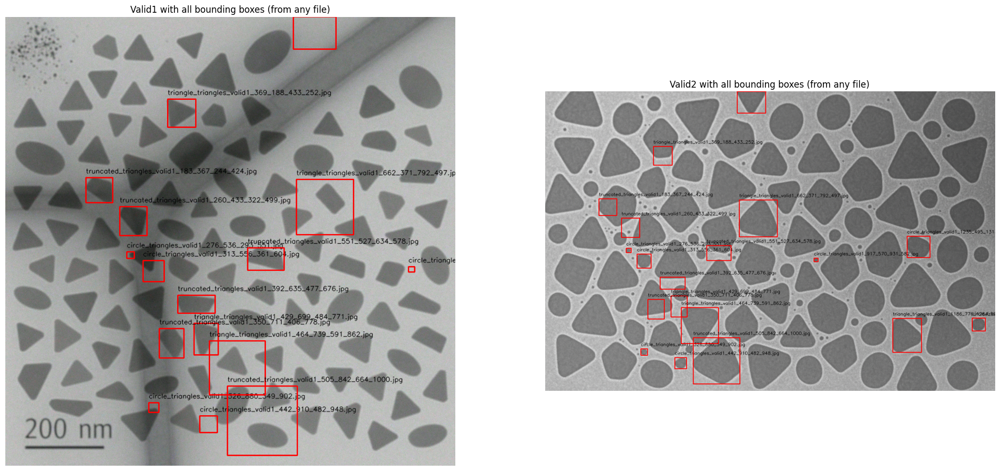

In [ ]:
import cv2
import os
from matplotlib import pyplot as plt

# Paths
bbox_folder = '/content/drive/MyDrive/triangles_project/yolo_data/validation/images'
valid_images_folder = '/content/drive/MyDrive/triangles_project/triangles_full_images/valid'

valid_images = {
    'valid1': 'triangles_valid1.jpg',
    'valid2': 'triangles_valid2.png'
}

def draw_all_bboxes(img, bbox_files):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for filename in bbox_files:
        name_parts = filename.split('.')[0].split('_')
        try:
            x1, y1, x2, y2 = map(int, name_parts[-4:])
            # Draw the rectangle
            cv2.rectangle(img_rgb, (x1, y1), (x2, y2), color=(255, 0, 0), thickness=2)
            # Draw filename above bbox
            cv2.putText(img_rgb, filename, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
                        0.5, (0, 0, 0), 1, cv2.LINE_AA)
        except Exception as e:
            print(f"❌ Error parsing bbox for {filename}: {e}")
    return img_rgb

# Load bbox filenames once
all_bbox_files = os.listdir(bbox_folder)

# Load both images
img1 = cv2.imread(os.path.join(valid_images_folder, valid_images['valid1']))
img2 = cv2.imread(os.path.join(valid_images_folder, valid_images['valid2']))

if img1 is None or img2 is None:
    raise FileNotFoundError("One or both images not found.")

# Draw all bboxes on both images
img1_with_bboxes = draw_all_bboxes(img1, all_bbox_files)
img2_with_bboxes = draw_all_bboxes(img2, all_bbox_files)

# Plot side by side
fig, axs = plt.subplots(1, 2, figsize=(24, 12))
axs[0].imshow(img1_with_bboxes)
axs[0].axis('off')
axs[0].set_title('Valid1 with all bounding boxes (from any file)')

axs[1].imshow(img2_with_bboxes)
axs[1].axis('off')
axs[1].set_title('Valid2 with all bounding boxes (from any file)')

plt.show()


In [ ]:
''' valid1 bboxes that are really VALID2!!:
circle_triangles_valid1_326_880_349_902.jpg
circle_triangle_valid1_442_910_482_948.jpg
circle_triangles_valid1_917_570_931_582.jpg
circle_triangles_valid1_1235_495_1313_568.jpg
circle_triangles_valid1_1457_775_1502_819.jpg
circle_triangles_valid1_313_556_361_604.jpg
cricle_triangles_valid1_276_536_293_551.jpg
truncated_triangles_valid1_505_842_664_1000.jpg
triangle_triangles_valid1_464_739_591_862.jpg
triangle_triangles_valid1_655_0_752_74.jpg
triangle_triangles_valid1_662_371_792_497.jpg
triangle_triangles_valid1_1186_776_1284_892.jpg
'''

In [ ]:
# Define explicit bbox filenames for valid2
filenames_for_valid2 = {
    "triangle_triangles_valid1_655_0_752_74.jpg",
    "circle_triangles_valid1_326_880_349_902.jpg",
    "circle_triangle_valid1_442_910_482_948.jpg",
    "truncated_triangles_valid1_505_842_664_1000.jpg",
    "triangle_triangles_valid1_464_739_591_862.jpg",
    "circle_triangles_valid1_313_556_361_604.jpg",
    "cricle_triangles_valid1_276_536_293_551.jpg",
    "triangle_triangles_valid1_662_371_792_497.jpg",
    "circle_triangles_valid1_917_570_931_582.jpg",
    "circle_triangles_valid1_1235_495_1313_568.jpg",
    "circle_triangles_valid1_1457_775_1502_819.jpg",
    "triangle_triangles_valid1_1186_776_1284_892.jpg"
}

# Get all bbox files from the folder
import os

bbox_folder = '/content/drive/MyDrive/triangles_project/yolo_data/validation/images'
all_bbox_files = set(os.listdir(bbox_folder))

# All others are assumed to belong to valid1
filenames_for_valid1 = all_bbox_files - filenames_for_valid2

# Check for overlap just in case
overlap = filenames_for_valid1.intersection(filenames_for_valid2)
if overlap:
    print("⚠️ The following bbox filenames appear in both valid1 and valid2:")
    for fname in overlap:
        print("-", fname)
else:
    print("✅ No overlap between valid1 and valid2 bbox filenames.")


✅ No overlap between valid1 and valid2 bbox filenames.


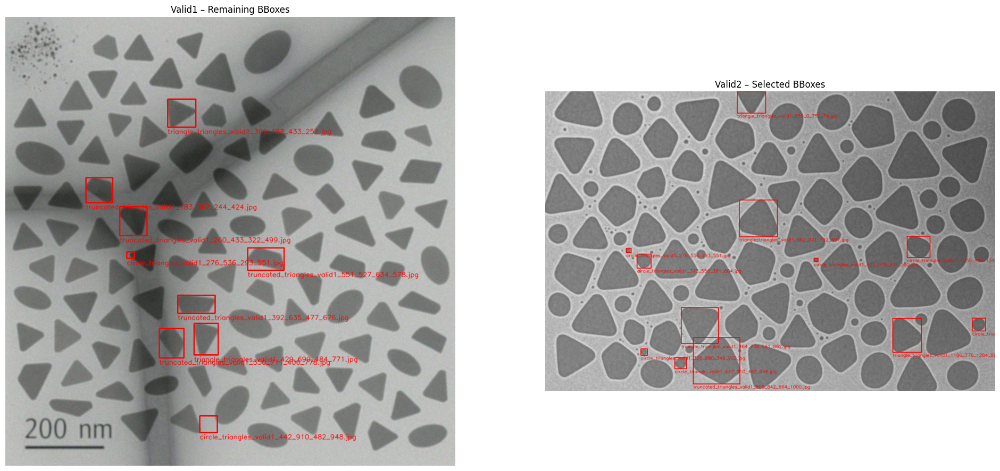

In [ ]:
# fixed bboxes:

# Get all bbox filenames in the directory
all_bbox_files = os.listdir(bbox_folder)

# Group: valid2 specified above, the rest go to valid1
filenames_for_valid1 = [f for f in all_bbox_files if f not in filenames_for_valid2]

def draw_specific_bboxes(image_path, filenames):
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Could not load image: {image_path}")

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for filename in filenames:
        name_parts = filename.split('.')[0].split('_')
        try:
            x1, y1, x2, y2 = map(int, name_parts[-4:])
            # Draw box
            cv2.rectangle(img_rgb, (x1, y1), (x2, y2), color=(255, 0, 0), thickness=2)
            # Draw filename below the box
            cv2.putText(img_rgb, filename, (x1, y2 + 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                        (255, 0, 0), 1, cv2.LINE_AA)
        except Exception as e:
            print(f"Error parsing bbox for {filename}: {e}")
    return img_rgb

# Draw bboxes for valid1 and valid2
img1_with_bboxes = draw_specific_bboxes(
    os.path.join(valid_images_folder, 'triangles_valid1.jpg'),
    filenames_for_valid1
)

img2_with_bboxes = draw_specific_bboxes(
    os.path.join(valid_images_folder, 'triangles_valid2.png'),
    filenames_for_valid2
)

# Display side by side
fig, axs = plt.subplots(1, 2, figsize=(24, 12))
axs[0].imshow(img1_with_bboxes)
axs[0].axis('off')
axs[0].set_title('Valid1 – Remaining BBoxes')

axs[1].imshow(img2_with_bboxes)
axs[1].axis('off')
axs[1].set_title('Valid2 – Selected BBoxes')

plt.show()


fixed bbox maping to valid1 or valid2 problem manually.

# **Masking train and valid images:**

In [ ]:
import cv2
import numpy as np
import os # Import os module

def process_yolo_labels(base_dir, base_filename):
    # Load image
      label_path = f"{base_dir}/labels/{base_filename}.txt"
      image_path = f"{base_dir}/images/{base_filename}.jpg"
      image = cv2.imread(image_path)
      if image is None: # Added check for successful image loading
          print(f"Error: Could not load image from {image_path}")
          return

      h, w = image.shape[:2]
      black_image = np.zeros_like(image)  # Create black canvas

      # Read YOLO label file
      if not os.path.exists(label_path): # Added check for label file existence
          print(f"Error: Label file not found at {label_path}")
          return

      with open(label_path, 'r') as f:
          lines = f.readlines()

      for line in lines:
          parts = line.strip().split()
          if len(parts) != 5:
              continue  # Skip invalid lines

          class_id, x_center, y_center, box_w, box_h = map(float, parts)

          # Convert YOLO format (normalized) to pixel coordinates
          x_center *= w
          y_center *= h
          box_w *= w
          box_h *= h
          x1 = int(x_center - box_w / 2)
          y1 = int(y_center - box_h / 2)
          x2 = int(x_center + box_w / 2)
          y2 = int(y_center + box_h / 2)

          # Ensure bounding box coordinates are within image bounds
          x1, y1, x2, y2 = max(0, x1), max(0, y1), min(w, x2), min(h, y2)
          if x1 >= x2 or y1 >= y2: # Skip invalid or empty boxes
              print(f"Warning: Invalid or empty bounding box for line: {line.strip()}")
              continue

          # Paste the detected object onto the black image
          black_image[y1:y2, x1:x2] = image[y1:y2, x1:x2]

      output_dir=os.path.join(base_dir, 'masked_images')
      os.makedirs(output_dir, exist_ok=True)
      output_path = os.path.join(output_dir, f"{base_filename}.jpg") # Example: save as JPEG
      cv2.imwrite(output_path, black_image)
      print(f"Saved result to {output_path}")

In [ ]:
process_yolo_labels("/content/drive/MyDrive/triangles_project/triangles_full_images/train", "triangles_train1")
process_yolo_labels("/content/drive/MyDrive/triangles_project/triangles_full_images/train", "triangles_train2")
process_yolo_labels("/content/drive/MyDrive/triangles_project/triangles_full_images/train", "triangles_train3")
process_yolo_labels("/content/drive/MyDrive/triangles_project/triangles_full_images/valid", "triangles_valid1")
process_yolo_labels("/content/drive/MyDrive/triangles_project/triangles_full_images/valid", "triangles_valid2")

Saved result to /content/drive/MyDrive/triangles_project/triangles_full_images/train/masked_images/triangles_train1.jpg
Saved result to /content/drive/MyDrive/triangles_project/triangles_full_images/train/masked_images/triangles_train2.jpg
Saved result to /content/drive/MyDrive/triangles_project/triangles_full_images/train/masked_images/triangles_train3.jpg
Saved result to /content/drive/MyDrive/triangles_project/triangles_full_images/valid/masked_images/triangles_valid1.jpg
Saved result to /content/drive/MyDrive/triangles_project/triangles_full_images/valid/masked_images/triangles_valid2.jpg
Saved result to /content/drive/MyDrive/triangles_project/triangles_full_images/test/masked_images/triangles_test.jpg


In [ ]:

process_yolo_labels("triangles_full_images/test", "triangles_test")

Saved result to triangles_full_images/test/masked_images/triangles_test.jpg


# TRAIN:

In [ ]:
'''

triangles_full_images/
├── train/
│   ├── images/
|   |── masked_images/
│   └── labels/
├── valid/
│   ├── images/
|   |── masked_images/
│   └── labels/
├── test/
│   ├── images/
|   |── masked_images/
│   └── labels/

'''

train:

In [12]:
!yolo task=detect mode=train model=yolo11s.pt data='/content/triangles_full_images/triangles_full_images_yaml.yaml' epochs=50 batch=8 #train_11s

Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/triangles_full_images/triangles_full_images_yaml.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0,

In [9]:
!yolo task=detect mode=train model=yolo11m.pt data='/content/triangles_full_images/triangles_full_images_yaml.yaml' epochs=50 batch=8 #train_11m

100% 38.8M/38.8M [00:00<00:00, 234MB/s]
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/triangles_full_images/triangles_full_images_yaml.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_m

In [8]:
!yolo task=detect mode=train model=yolo11l.pt data='/content/triangles_full_images/triangles_full_images_yaml.yaml' epochs=50 batch=8 #train_11l

100% 49.0M/49.0M [00:00<00:00, 260MB/s]
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/triangles_full_images/triangles_full_images_yaml.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_ma

In [11]:
!yolo task=detect mode=train model=yolo11x.pt data='/content/triangles_full_images/triangles_full_images_yaml.yaml' epochs=50 batch=8 #train_11x

100% 109M/109M [00:00<00:00, 397MB/s] 
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/triangles_full_images/triangles_full_images_yaml.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11x.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_ma

predict:

In [13]:
!yolo task=detect mode=predict model=/content/runs/detect/train_11s/weights/best.pt source=/content/triangles_full_images/test/images save=True

Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,413,961 parameters, 0 gradients, 21.3 GFLOPs

image 1/1 /content/triangles_full_images/test/images/triangles_test.jpg: 608x640 22 circles, 49 triangles, 38 truncateds, 73.2ms
Speed: 5.1ms preprocess, 73.2ms inference, 185.1ms postprocess per image at shape (1, 3, 608, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [14]:
!yolo task=detect mode=predict model=/content/runs/detect/train_11m/weights/best.pt source=/content/triangles_full_images/test/images save=True

Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,032,345 parameters, 0 gradients, 67.7 GFLOPs

image 1/1 /content/triangles_full_images/test/images/triangles_test.jpg: 608x640 16 circles, 76 triangles, 9 truncateds, 45.4ms
Speed: 5.0ms preprocess, 45.4ms inference, 128.6ms postprocess per image at shape (1, 3, 608, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [15]:
!yolo task=detect mode=predict model=/content/runs/detect/train_11l/weights/best.pt source=/content/triangles_full_images/test/images save=True

Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11l summary (fused): 190 layers, 25,281,625 parameters, 0 gradients, 86.6 GFLOPs

image 1/1 /content/triangles_full_images/test/images/triangles_test.jpg: 608x640 52 circles, 24 triangles, 20 truncateds, 53.5ms
Speed: 4.0ms preprocess, 53.5ms inference, 142.4ms postprocess per image at shape (1, 3, 608, 640)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [16]:
!yolo task=detect mode=predict model=/content/runs/detect/train_11x/weights/best.pt source=/content/triangles_full_images/test/images save=True

Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11x summary (fused): 190 layers, 56,830,489 parameters, 0 gradients, 194.4 GFLOPs

image 1/1 /content/triangles_full_images/test/images/triangles_test.jpg: 608x640 12 circles, 38 triangles, 29 truncateds, 77.6ms
Speed: 4.4ms preprocess, 77.6ms inference, 134.2ms postprocess per image at shape (1, 3, 608, 640)
Results saved to runs/detect/predict4
💡 Learn more at https://docs.ultralytics.com/modes/predict


changed to: runs/detect/predict_11s, runs/detect/predict_11m, runs/detect/predict_11l, runs/detect/predict_11x

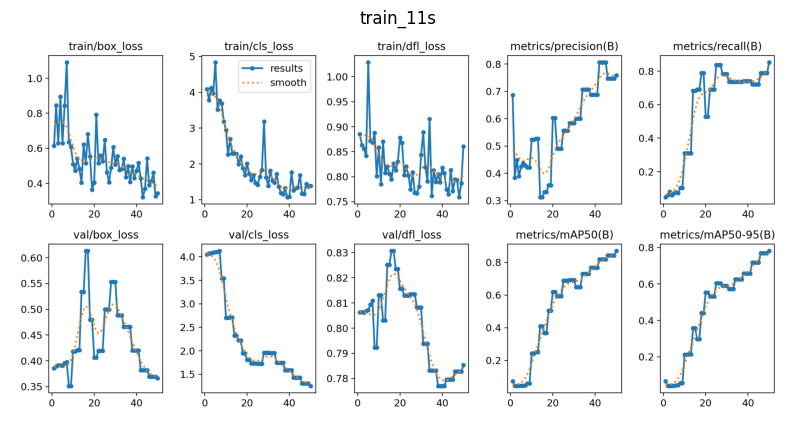

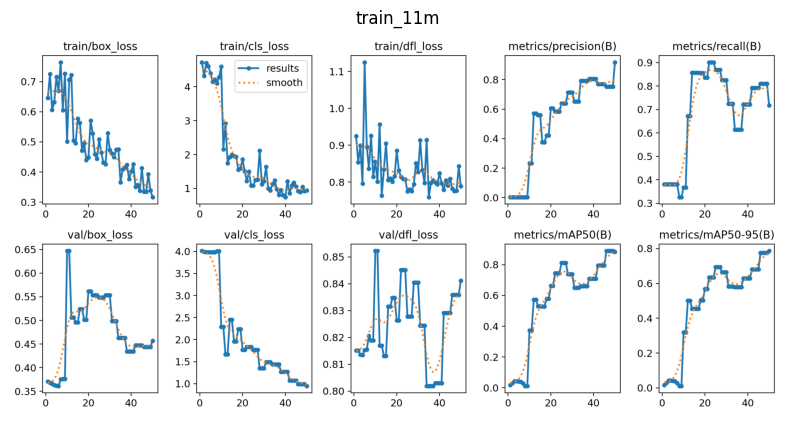

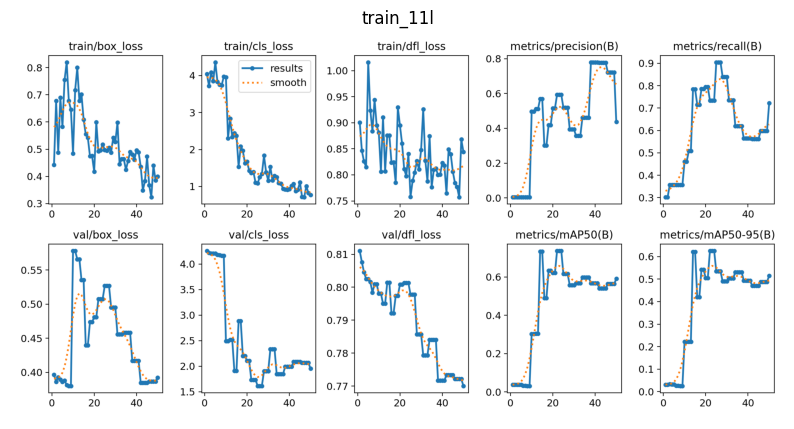

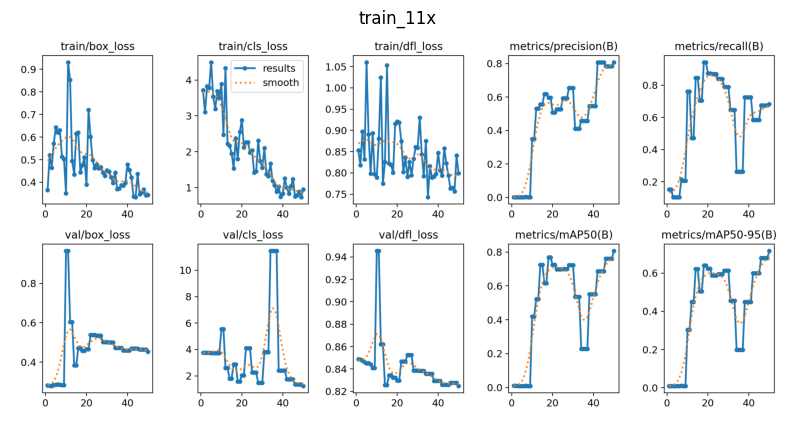

In [19]:
import matplotlib.pyplot as plt
import cv2

# List of run names
runs = ['train_11s', 'train_11m', 'train_11l', 'train_11x']

# Loop through each run and display its results.png
for run in runs:
    image_path = f'/content/runs/detect/{run}/results.png'
    image = cv2.imread(image_path)

    if image is not None:
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(10, 10))
        plt.imshow(image_rgb)
        plt.title(run)
        plt.axis('off')
        plt.show()
    else:
        print(f"Error: Could not read image from {image_path}")


predict on val and test:

In [21]:
# List of run folder names
#runs = ['train_11s', 'train_11m', 'train_11l', 'train_11x', 'predict_11s']
# Path to data.yaml
data_yaml = '/content/triangles_full_images/triangles_full_images_yaml.yaml'

# Evaluate each run
for run in runs:
    model_path = f'/content/runs/detect/{run}/weights/best.pt'
    print(f"\nEvaluating {run}...")

    try:
        model = YOLO(model_path)
    except Exception as e:
        print(f"Error loading model from {model_path}: {e}")
        continue

    for split in ['val', 'test']:
        print(f"\nSplit: {split}")
        try:
            results = model.val(data=data_yaml, split=split)

            precision = results.box.p  # Precision
            recall = results.box.r    # Recall

            print(f"Precision: {precision:.3f}")
            print(f"Recall: {recall:.3f}")
        except Exception as e:
            print(f"Error evaluating split '{split}' for {run}: {e}")



Evaluating train_11s...

Split: val
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,413,961 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.2 ms, read: 162.2±209.3 MB/s, size: 634.4 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/valid/labels.cache... 2 images, 3 backgrounds, 0 corrupt: 100%|██████████| 5/5 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]


                   all          5         19      0.758      0.851      0.869      0.768
                circle          1          7          1      0.567      0.905      0.684
              triangle          2          6       0.61          1      0.851      0.804
             truncated          2          6      0.663      0.987      0.851      0.817
Speed: 0.5ms preprocess, 19.2ms inference, 0.0ms loss, 41.0ms postprocess per image
Results saved to runs/detect/val
Error evaluating split 'val' for train_11s: unsupported format string passed to numpy.ndarray.__format__

Split: test
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.2±0.0 ms, read: 0.4±0.0 MB/s, size: 199.0 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/test/labels... 1 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

val: New cache created: /content/drive/MyDrive/triangles_project/triangles_full_images/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.54it/s]


                   all          1        105      0.506      0.711       0.51      0.438
                circle          1         11        0.5      0.908      0.581      0.502
              triangle          1         83      0.859      0.588      0.779      0.665
             truncated          1         11      0.159      0.636      0.171      0.148
Speed: 0.5ms preprocess, 81.1ms inference, 0.0ms loss, 23.8ms postprocess per image
Results saved to runs/detect/val2
Error evaluating split 'test' for train_11s: unsupported format string passed to numpy.ndarray.__format__

Evaluating train_11m...

Split: val
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,032,345 parameters, 0 gradients, 67.7 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 178.1±242.8 MB/s, size: 634.4 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/valid/labels.cache... 2 images, 3 backgrounds, 0 corrupt: 100%|██████████| 5/5 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


                   all          5         19      0.918      0.718      0.885      0.798
                circle          1          7          1      0.537       0.86      0.737
              triangle          2          6       0.93      0.833      0.909      0.866
             truncated          2          6      0.824      0.784      0.885      0.792
Speed: 0.3ms preprocess, 36.7ms inference, 0.0ms loss, 11.3ms postprocess per image
Results saved to runs/detect/val3
Error evaluating split 'val' for train_11m: unsupported format string passed to numpy.ndarray.__format__

Split: test
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.2±0.0 ms, read: 80.8±0.0 MB/s, size: 199.0 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/test/labels.cache... 1 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1/1 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.55it/s]


                   all          1        105       0.57      0.556      0.573      0.487
                circle          1         11       0.59      0.787       0.64      0.559
              triangle          1         83      0.866      0.698       0.87      0.708
             truncated          1         11      0.255      0.182      0.207      0.196
Speed: 0.4ms preprocess, 56.4ms inference, 0.0ms loss, 10.5ms postprocess per image
Results saved to runs/detect/val4
Error evaluating split 'test' for train_11m: unsupported format string passed to numpy.ndarray.__format__

Evaluating train_11l...

Split: val
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11l summary (fused): 190 layers, 25,281,625 parameters, 0 gradients, 86.6 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 125.8±143.9 MB/s, size: 634.4 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/valid/labels.cache... 2 images, 3 backgrounds, 0 corrupt: 100%|██████████| 5/5 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


                   all          5         19      0.594      0.733      0.736       0.63
                circle          1          7      0.368      0.857      0.718      0.521
              triangle          2          6      0.788        0.5      0.788      0.723
             truncated          2          6      0.627      0.842      0.703      0.646
Speed: 1.8ms preprocess, 46.2ms inference, 0.0ms loss, 11.4ms postprocess per image
Results saved to runs/detect/val5
Error evaluating split 'val' for train_11l: unsupported format string passed to numpy.ndarray.__format__

Split: test
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.2±0.0 ms, read: 80.7±0.0 MB/s, size: 199.0 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/test/labels.cache... 1 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1/1 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.41it/s]


                   all          1        105      0.306      0.846      0.522      0.451
                circle          1         11     0.0919          1      0.624      0.514
              triangle          1         83      0.713      0.809      0.792      0.701
             truncated          1         11      0.114      0.727      0.151      0.138
Speed: 0.5ms preprocess, 52.4ms inference, 0.0ms loss, 20.5ms postprocess per image
Results saved to runs/detect/val6
Error evaluating split 'test' for train_11l: unsupported format string passed to numpy.ndarray.__format__

Evaluating train_11x...

Split: val
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11x summary (fused): 190 layers, 56,830,489 parameters, 0 gradients, 194.4 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 166.1±217.6 MB/s, size: 634.4 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/valid/labels.cache... 2 images, 3 backgrounds, 0 corrupt: 100%|██████████| 5/5 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


                   all          5         19      0.806      0.683      0.807      0.718
                circle          1          7          1      0.557      0.863      0.725
              triangle          2          6          1      0.494      0.845      0.788
             truncated          2          6      0.417          1      0.712      0.641
Speed: 0.3ms preprocess, 72.3ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to runs/detect/val7
Error evaluating split 'val' for train_11x: unsupported format string passed to numpy.ndarray.__format__

Split: test
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.2±0.0 ms, read: 73.4±0.0 MB/s, size: 199.0 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/test/labels.cache... 1 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1/1 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.23it/s]


                   all          1        105      0.592      0.717      0.642      0.574
                circle          1         11      0.653      0.818      0.746      0.644
              triangle          1         83      0.914      0.515      0.867      0.788
             truncated          1         11      0.209      0.818      0.313      0.289
Speed: 0.5ms preprocess, 90.0ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to runs/detect/val8
Error evaluating split 'test' for train_11x: unsupported format string passed to numpy.ndarray.__format__


In [22]:
!cp -r /content/runs /content/drive/MyDrive/yolo_runs_backup

visualizing predictions on test and valid:

valid1:


image 1/1 /content/triangles_full_images/valid/images/triangles_valid1.jpg: 640x640 5 triangles, 3 truncateds, 15.6ms
Speed: 4.5ms preprocess, 15.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict_train_11s5
model: train_11s


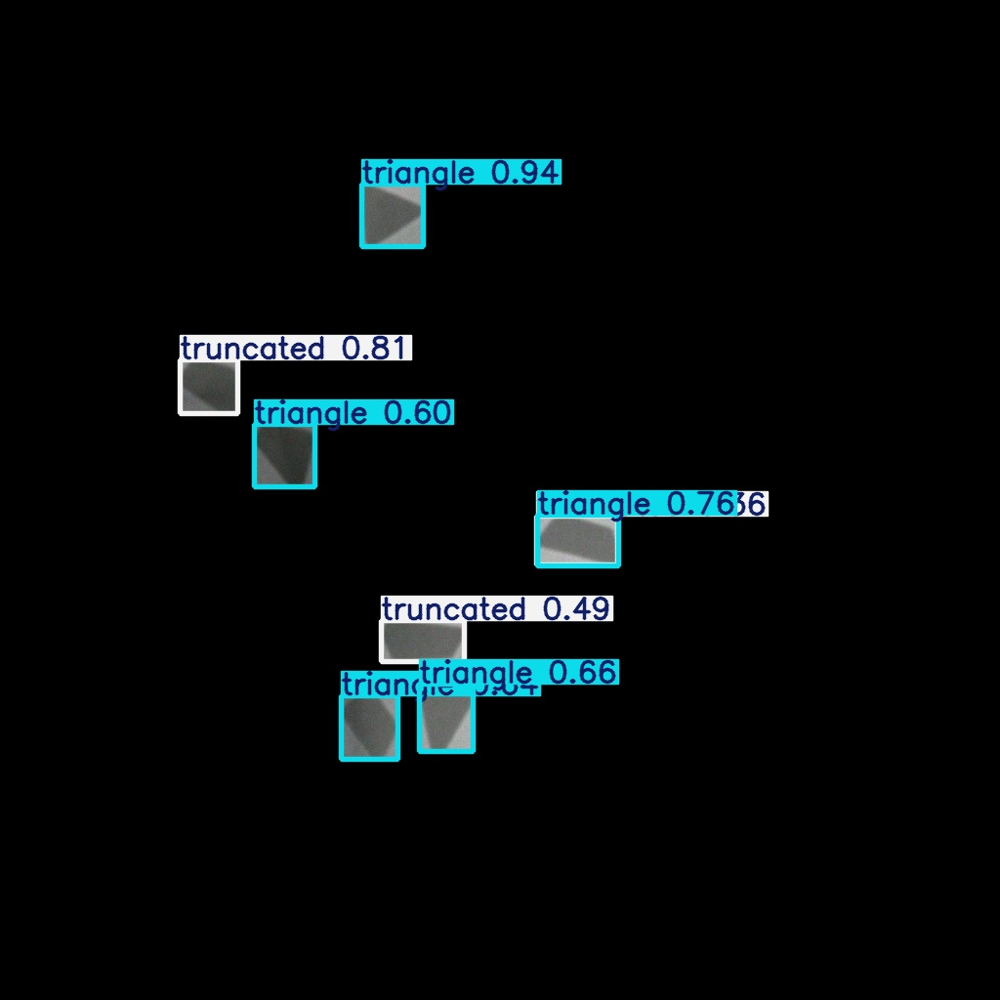


image 1/1 /content/triangles_full_images/valid/images/triangles_valid1.jpg: 640x640 4 triangles, 6 truncateds, 36.8ms
Speed: 3.2ms preprocess, 36.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict_train_11m5
model: train_11m


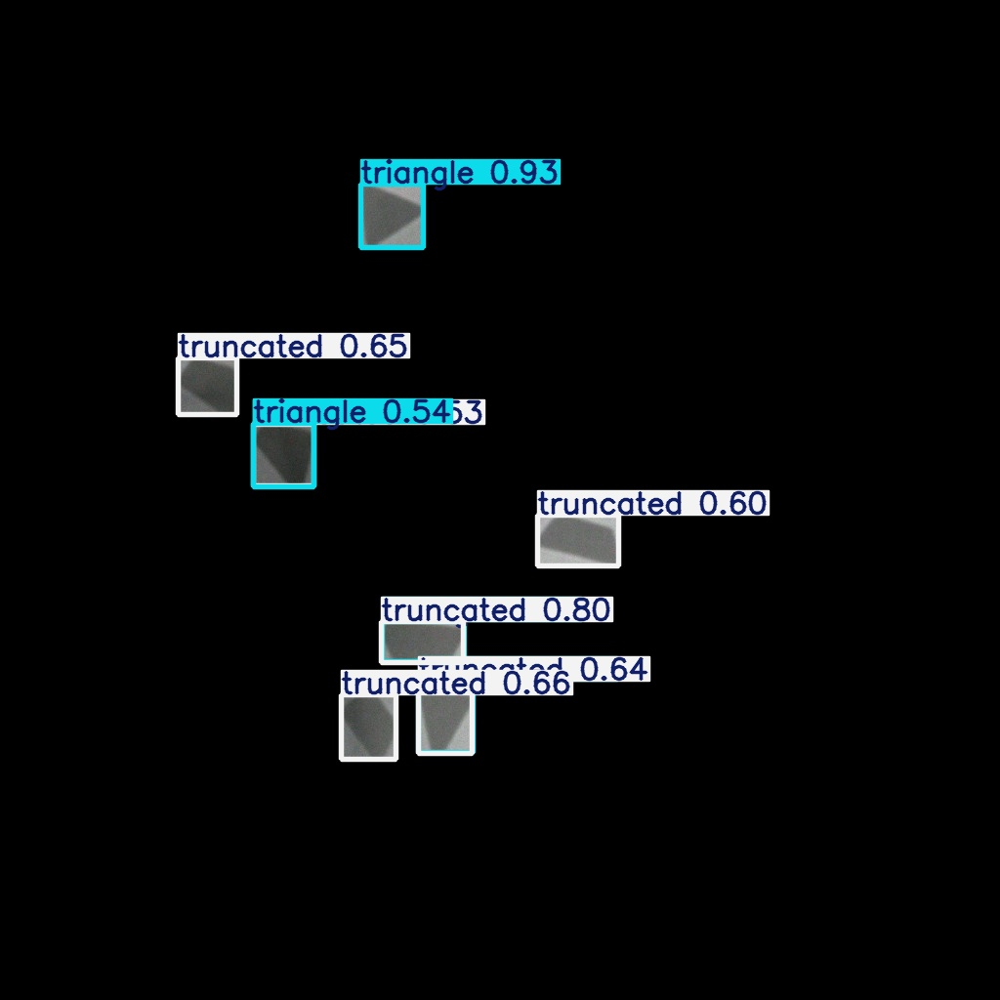


image 1/1 /content/triangles_full_images/valid/images/triangles_valid1.jpg: 640x640 7 circles, 3 triangles, 5 truncateds, 47.4ms
Speed: 3.2ms preprocess, 47.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict_train_11l5
model: train_11l


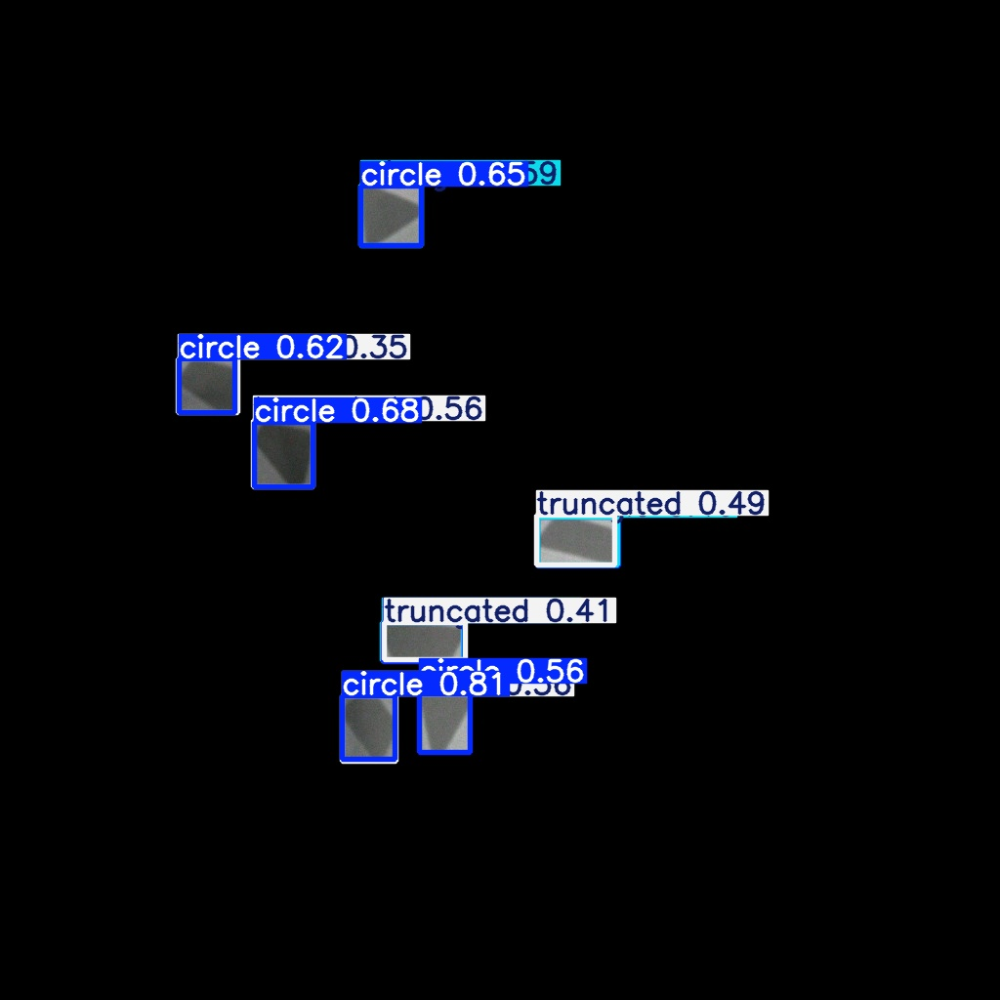


image 1/1 /content/triangles_full_images/valid/images/triangles_valid1.jpg: 640x640 1 triangle, 7 truncateds, 93.1ms
Speed: 3.2ms preprocess, 93.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict_train_11x5
model: train_11x


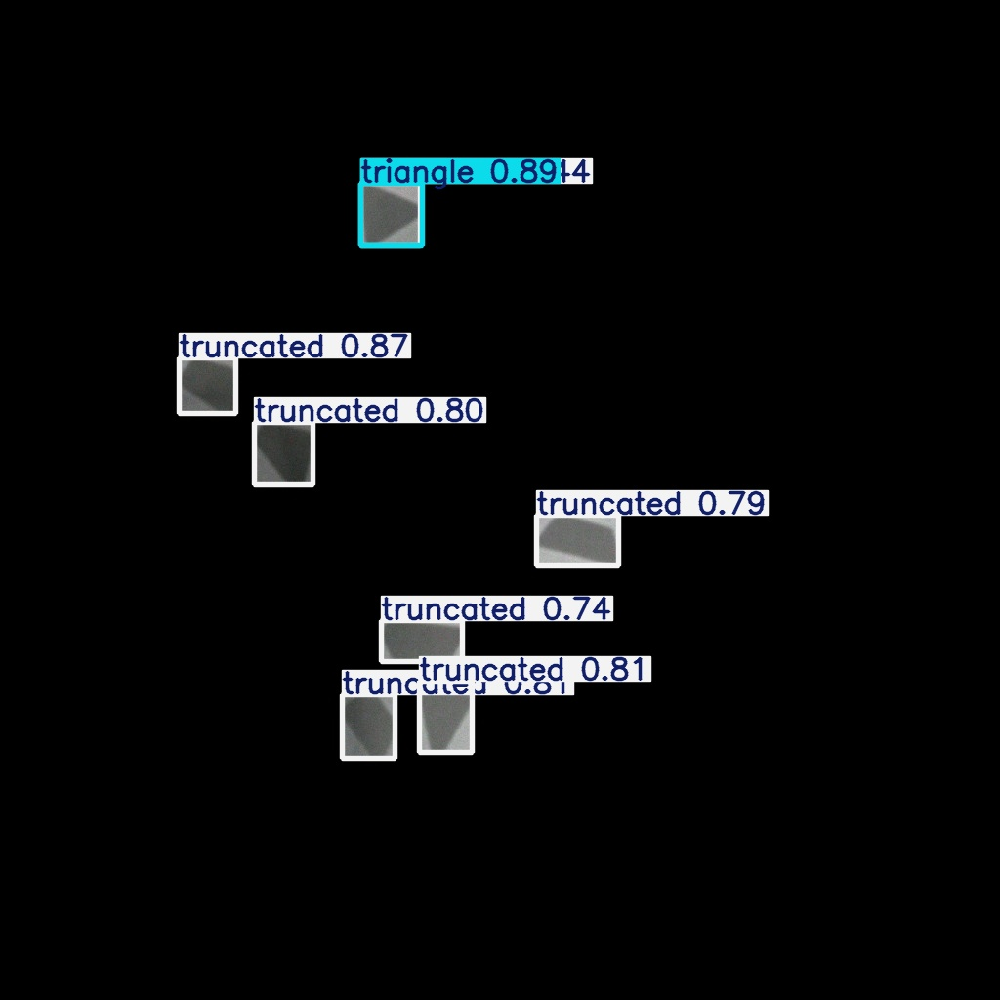

In [34]:
from ultralytics import YOLO
from IPython.display import Image as IPyImage
import os

val_img = "/content/triangles_full_images/valid/images/triangles_valid1.jpg"
runs = ['train_11s', 'train_11m', 'train_11l', 'train_11x']

for run in runs:
    model_path = f"/content/runs/detect/{run}/weights/best.pt"
    if not os.path.exists(model_path): continue

    model = YOLO(model_path)
    model.predict(source=val_img, save=True, name=f"predict_{run}")

    pred_path = f"/content/runs/detect/predict_{run}/{os.path.basename(val_img)}"
    if os.path.exists(pred_path):
        print(f"model: {run}")
        display(IPyImage(pred_path, width=600))


valid2:


image 1/1 /content/triangles_full_images/valid/images/triangles_valid2.jpg: 448x640 4 circles, 6 triangles, 2 truncateds, 15.1ms
Speed: 3.7ms preprocess, 15.1ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict_val2_train_11s
model: train_11s


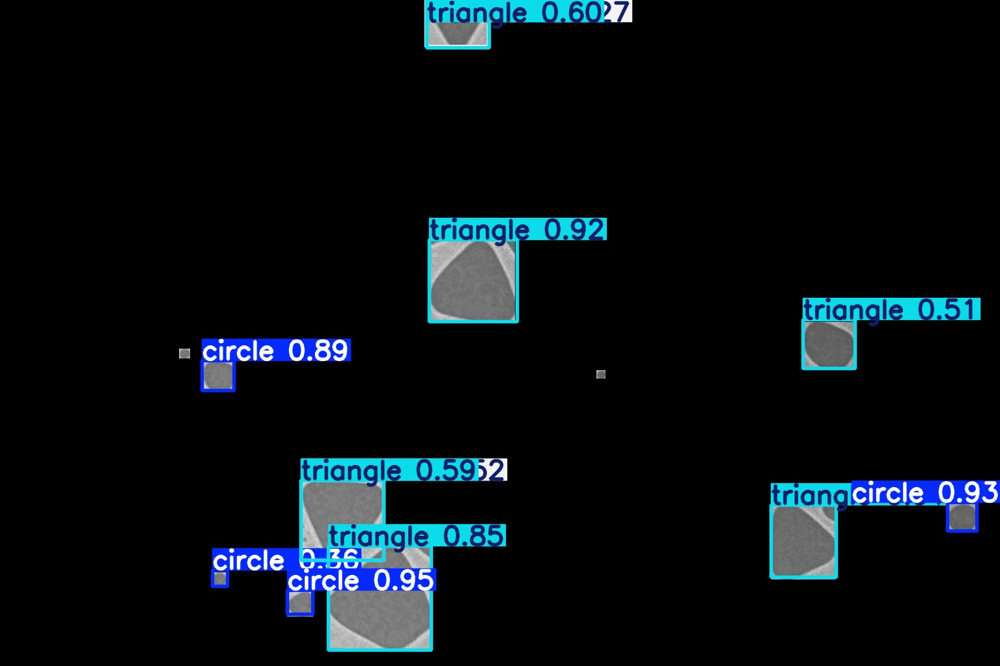


image 1/1 /content/triangles_full_images/valid/images/triangles_valid2.jpg: 448x640 4 circles, 5 triangles, 3 truncateds, 29.0ms
Speed: 2.5ms preprocess, 29.0ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict_val2_train_11m
model: train_11m


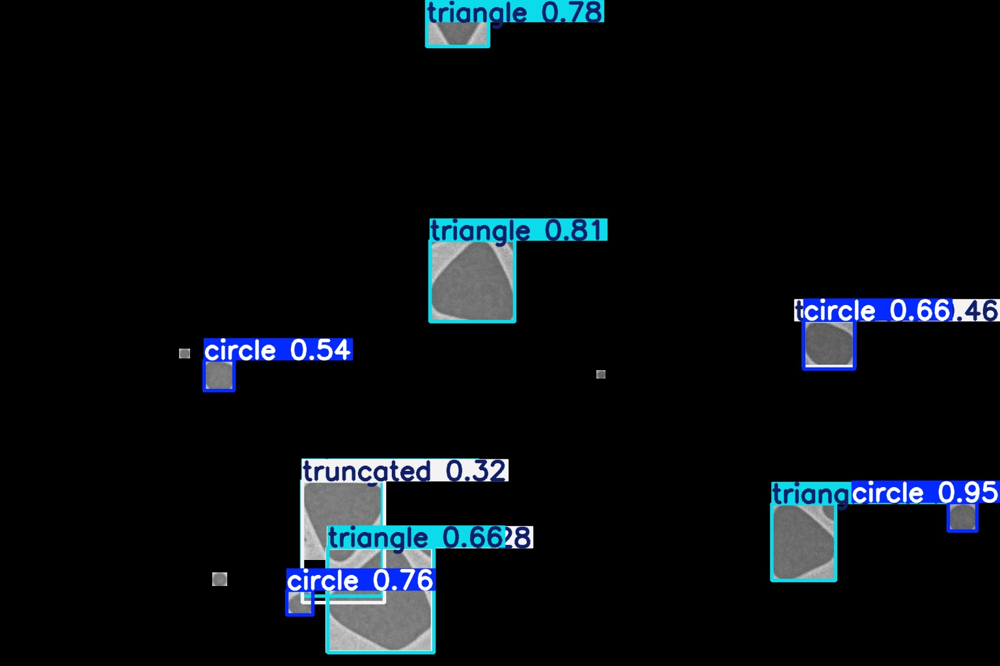


image 1/1 /content/triangles_full_images/valid/images/triangles_valid2.jpg: 448x640 12 circles, 1 triangle, 8 truncateds, 37.4ms
Speed: 2.5ms preprocess, 37.4ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict_val2_train_11l
model: train_11l


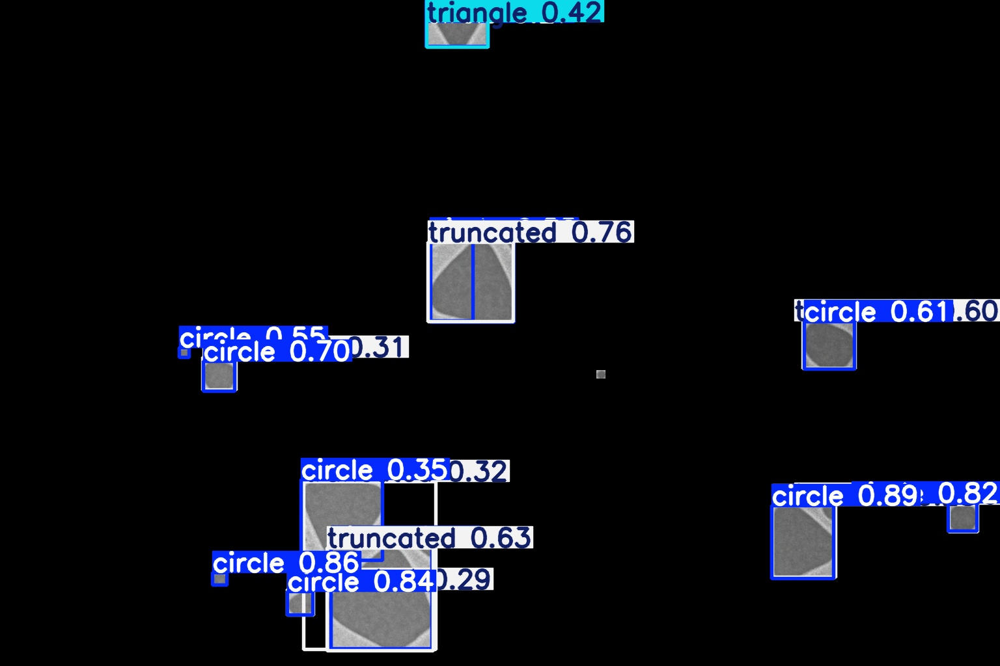


image 1/1 /content/triangles_full_images/valid/images/triangles_valid2.jpg: 448x640 3 circles, 1 triangle, 4 truncateds, 63.0ms
Speed: 2.5ms preprocess, 63.0ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict_val2_train_11x
model: train_11x


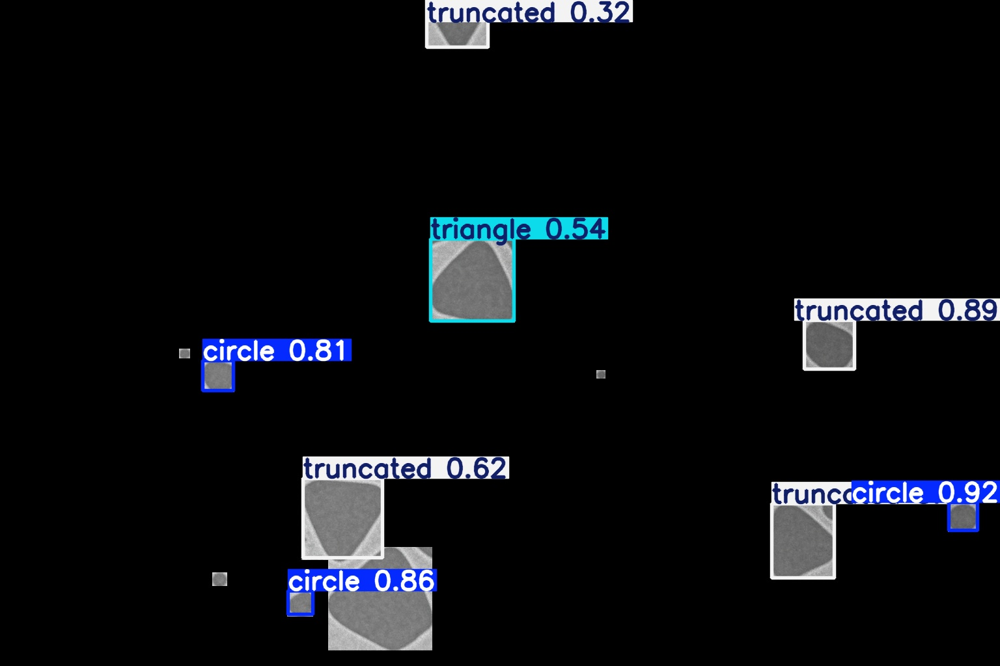

In [35]:
from ultralytics import YOLO
from IPython.display import Image as IPyImage
import os

val_img = "/content/triangles_full_images/valid/images/triangles_valid2.jpg"
runs = ['train_11s', 'train_11m', 'train_11l', 'train_11x']

for run in runs:
    model_path = f"/content/runs/detect/{run}/weights/best.pt"
    if not os.path.exists(model_path): continue

    model = YOLO(model_path)
    model.predict(source=val_img, save=True, name=f"predict_val2_{run}")

    pred_path = f"/content/runs/detect/predict_val2_{run}/{os.path.basename(val_img)}"
    if os.path.exists(pred_path):
        print(f"model: {run}")
        display(IPyImage(pred_path, width=600))


test:


image 1/1 /content/triangles_full_images/test/images/triangles_test.jpg: 608x640 22 circles, 49 triangles, 38 truncateds, 16.3ms
Speed: 4.9ms preprocess, 16.3ms inference, 2.3ms postprocess per image at shape (1, 3, 608, 640)
Results saved to runs/detect/predict_test_train_11s3
model: train_11s


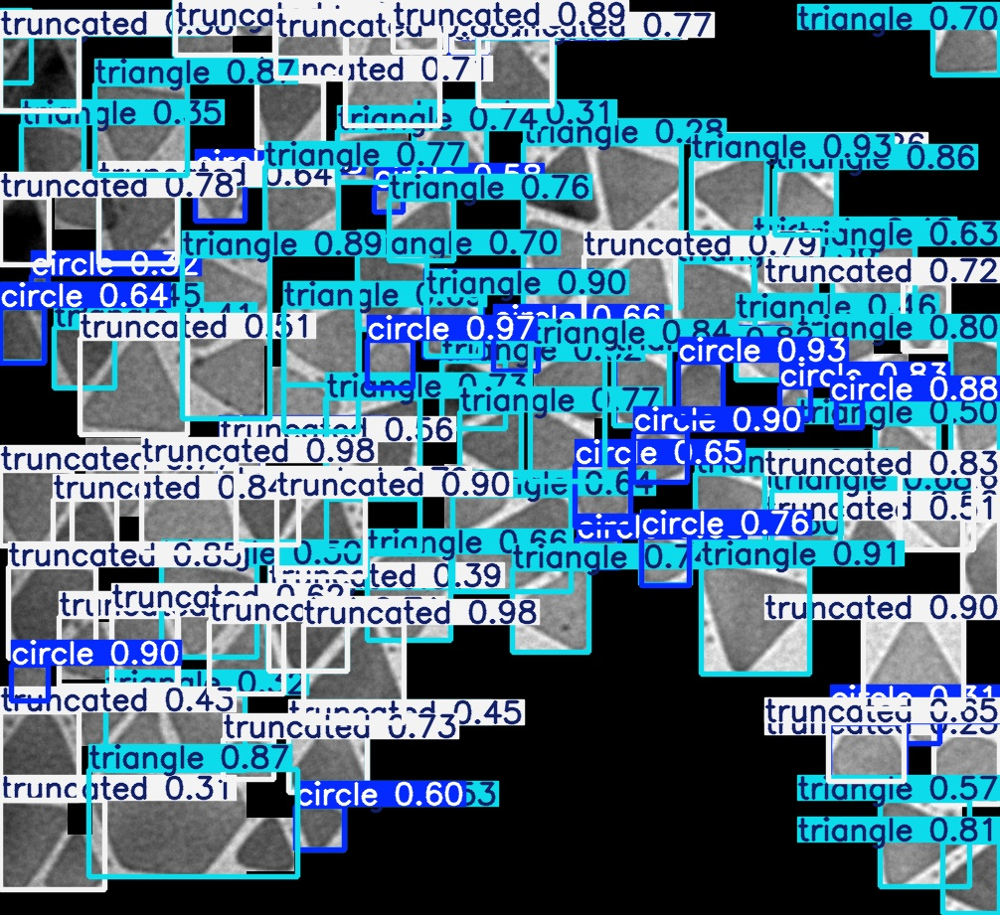


image 1/1 /content/triangles_full_images/test/images/triangles_test.jpg: 608x640 16 circles, 76 triangles, 9 truncateds, 36.9ms
Speed: 2.9ms preprocess, 36.9ms inference, 1.6ms postprocess per image at shape (1, 3, 608, 640)
Results saved to runs/detect/predict_test_train_11m3
model: train_11m


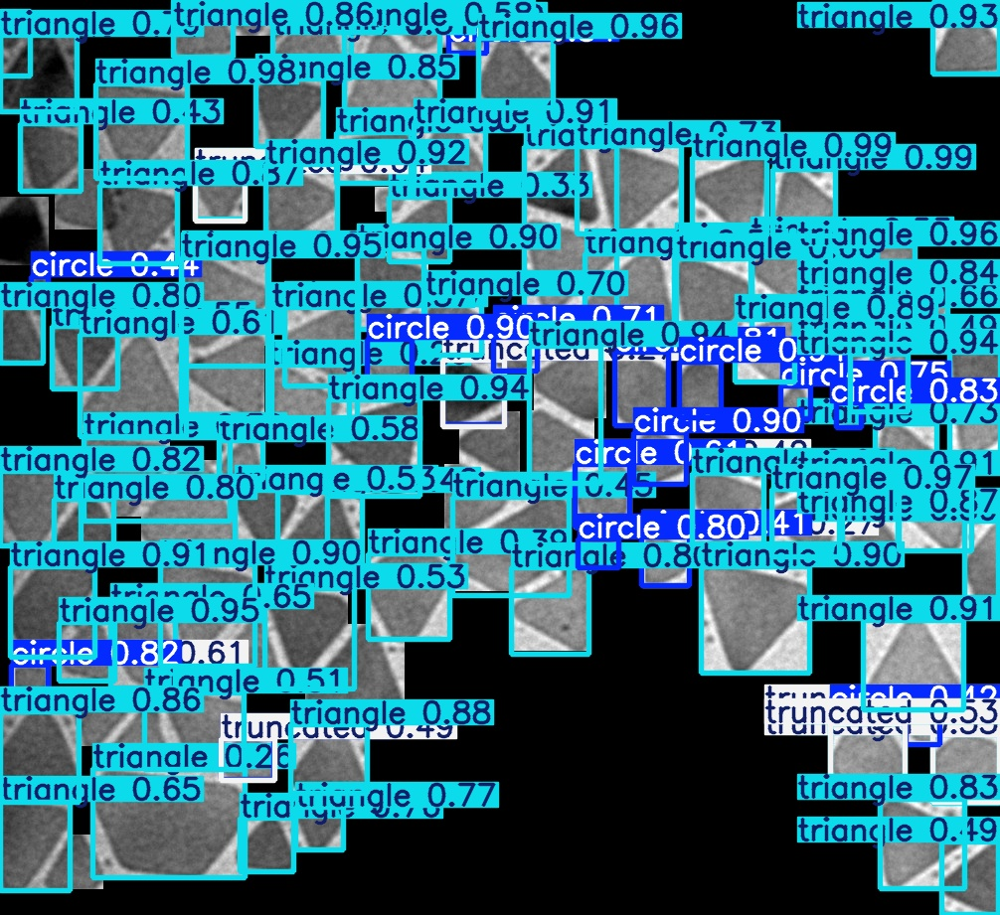


image 1/1 /content/triangles_full_images/test/images/triangles_test.jpg: 608x640 52 circles, 24 triangles, 20 truncateds, 47.6ms
Speed: 2.9ms preprocess, 47.6ms inference, 1.6ms postprocess per image at shape (1, 3, 608, 640)
Results saved to runs/detect/predict_test_train_11l3
model: train_11l


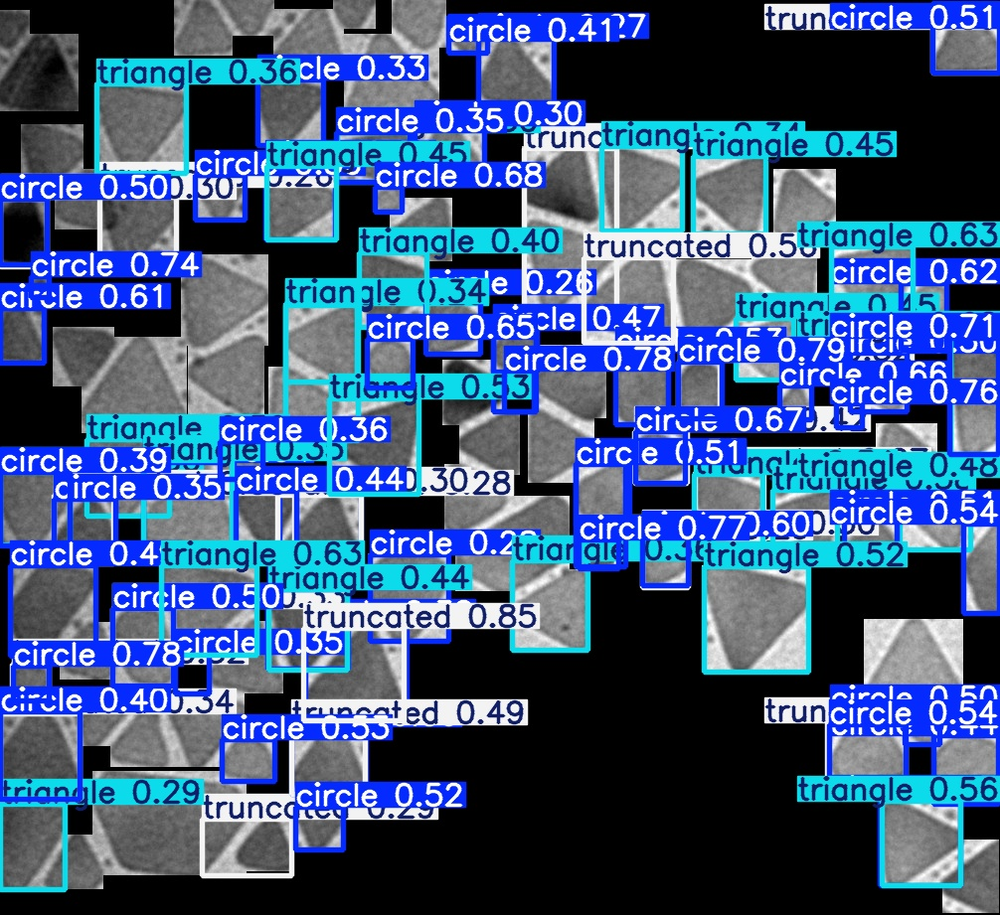


image 1/1 /content/triangles_full_images/test/images/triangles_test.jpg: 608x640 12 circles, 38 triangles, 29 truncateds, 70.6ms
Speed: 2.9ms preprocess, 70.6ms inference, 1.7ms postprocess per image at shape (1, 3, 608, 640)
Results saved to runs/detect/predict_test_train_11x3
model: train_11x


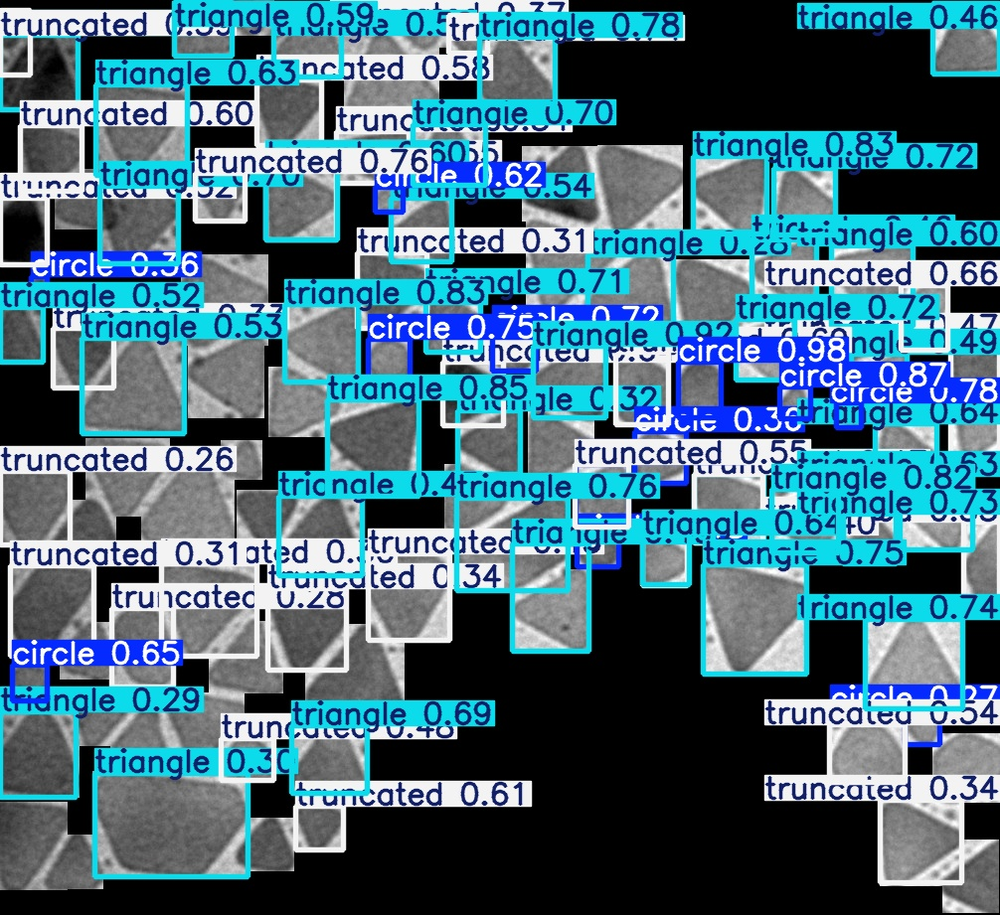

In [33]:
from ultralytics import YOLO
from IPython.display import Image as IPyImage
import os

val_img = "/content/triangles_full_images/test/images/triangles_test.jpg"
runs = ['train_11s', 'train_11m', 'train_11l', 'train_11x']

for run in runs:
    model_path = f"/content/runs/detect/{run}/weights/best.pt"
    if not os.path.exists(model_path): continue

    model = YOLO(model_path)
    model.predict(source=val_img, save=True, name=f"predict_test_{run}")

    pred_path = f"/content/runs/detect/predict_test_{run}/{os.path.basename(val_img)}"
    if os.path.exists(pred_path):
        print(f"model: {run}")
        display(IPyImage(pred_path, width=600))


testing wchich model is best for each split train val test

In [36]:

# List of trained models
runs = ['train_11s', 'train_11m', 'train_11l', 'train_11x']
data_yaml = '/content/triangles_full_images/triangles_full_images_yaml.yaml'

# Dictionary to store best model per split
best_models = {'train': None, 'val': None, 'test': None}
best_scores = {'train': 0, 'val': 0, 'test': 0}

for run in runs:
    model_path = f'/content/runs/detect/{run}/weights/best.pt'
    if not os.path.exists(model_path):
        print(f"Skipping {run} - best.pt not found.")
        continue

    model = YOLO(model_path)

    for split in ['train', 'val', 'test']:
        try:
            results = model.val(data=data_yaml, split=split, verbose=False)
            mAP = results.box.map  # mAP@0.5:0.95

            print(f"{run} | {split} mAP@0.5:0.95 = {mAP:.4f}")

            if mAP > best_scores[split]:
                best_scores[split] = mAP
                best_models[split] = run
        except Exception as e:
            print(f"{run} | {split} failed: {e}")

print("\n🏆 Best Models by Split:")
for split in ['train', 'val', 'test']:
    print(f"{split.title()}: {best_models[split]} (mAP@0.5:0.95 = {best_scores[split]:.4f})")


Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,413,961 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 27.6±22.1 MB/s, size: 76.3 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/train/labels.cache... 3 images, 3 backgrounds, 0 corrupt: 100%|██████████| 6/6 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


                   all          6         18      0.894      0.905      0.974       0.92
Speed: 0.3ms preprocess, 30.9ms inference, 0.0ms loss, 18.2ms postprocess per image
Results saved to runs/detect/val
train_11s | train mAP@0.5:0.95 = 0.9202
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 151.7±179.2 MB/s, size: 634.4 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/valid/labels.cache... 2 images, 3 backgrounds, 0 corrupt: 100%|██████████| 5/5 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


                   all          5         19      0.758      0.851      0.869      0.768
Speed: 0.3ms preprocess, 13.6ms inference, 0.0ms loss, 17.5ms postprocess per image
Results saved to runs/detect/val2
train_11s | val mAP@0.5:0.95 = 0.7681
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.1±0.0 ms, read: 72.7±0.0 MB/s, size: 199.0 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/test/labels.cache... 1 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1/1 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.72it/s]


                   all          1        105      0.506      0.711       0.51      0.438
Speed: 0.6ms preprocess, 53.5ms inference, 0.0ms loss, 38.3ms postprocess per image
Results saved to runs/detect/val3
train_11s | test mAP@0.5:0.95 = 0.4382
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,032,345 parameters, 0 gradients, 67.7 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.2 ms, read: 44.8±35.7 MB/s, size: 75.0 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/train/labels.cache... 3 images, 3 backgrounds, 0 corrupt: 100%|██████████| 6/6 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


                   all          6         18      0.968          1      0.995      0.949
Speed: 0.3ms preprocess, 35.3ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to runs/detect/val4
train_11m | train mAP@0.5:0.95 = 0.9490
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 154.2±185.0 MB/s, size: 634.4 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/valid/labels.cache... 2 images, 3 backgrounds, 0 corrupt: 100%|██████████| 5/5 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


                   all          5         19      0.918      0.718      0.885      0.798
Speed: 0.3ms preprocess, 36.8ms inference, 0.0ms loss, 7.5ms postprocess per image
Results saved to runs/detect/val5
train_11m | val mAP@0.5:0.95 = 0.7982
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.2±0.0 ms, read: 64.6±0.0 MB/s, size: 199.0 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/test/labels.cache... 1 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1/1 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.12it/s]


                   all          1        105       0.57      0.556      0.573      0.487
Speed: 2.7ms preprocess, 42.4ms inference, 0.0ms loss, 17.1ms postprocess per image
Results saved to runs/detect/val6
train_11m | test mAP@0.5:0.95 = 0.4874
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11l summary (fused): 190 layers, 25,281,625 parameters, 0 gradients, 86.6 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.2 ms, read: 22.7±14.2 MB/s, size: 40.7 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/train/labels.cache... 3 images, 3 backgrounds, 0 corrupt: 100%|██████████| 6/6 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


                   all          6         18      0.796      0.754      0.791      0.721
Speed: 0.3ms preprocess, 40.4ms inference, 0.0ms loss, 6.9ms postprocess per image
Results saved to runs/detect/val7
train_11l | train mAP@0.5:0.95 = 0.7215
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 74.4±51.2 MB/s, size: 634.4 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/valid/labels.cache... 2 images, 3 backgrounds, 0 corrupt: 100%|██████████| 5/5 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


                   all          5         19      0.594      0.733      0.736       0.63
Speed: 0.3ms preprocess, 43.6ms inference, 0.0ms loss, 8.2ms postprocess per image
Results saved to runs/detect/val8
train_11l | val mAP@0.5:0.95 = 0.6299
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.2±0.0 ms, read: 79.1±0.0 MB/s, size: 199.0 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/test/labels.cache... 1 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1/1 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.21it/s]


                   all          1        105      0.306      0.846      0.522      0.451
Speed: 0.4ms preprocess, 48.8ms inference, 0.0ms loss, 15.6ms postprocess per image
Results saved to runs/detect/val9
train_11l | test mAP@0.5:0.95 = 0.4509
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11x summary (fused): 190 layers, 56,830,489 parameters, 0 gradients, 194.4 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 30.9±39.9 MB/s, size: 60.0 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/train/labels.cache... 3 images, 3 backgrounds, 0 corrupt: 100%|██████████| 6/6 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


                   all          6         18      0.872      0.993      0.984      0.902
Speed: 0.3ms preprocess, 81.3ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to runs/detect/val10
train_11x | train mAP@0.5:0.95 = 0.9022
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 152.3±182.5 MB/s, size: 634.4 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/valid/labels.cache... 2 images, 3 backgrounds, 0 corrupt: 100%|██████████| 5/5 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


                   all          5         19      0.806      0.683      0.807      0.718
Speed: 0.3ms preprocess, 83.0ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to runs/detect/val11
train_11x | val mAP@0.5:0.95 = 0.7178
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.2±0.0 ms, read: 80.1±0.0 MB/s, size: 199.0 KB)


val: Scanning /content/drive/MyDrive/triangles_project/triangles_full_images/test/labels.cache... 1 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1/1 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.99it/s]


                   all          1        105      0.592      0.717      0.642      0.574
Speed: 0.9ms preprocess, 101.6ms inference, 0.0ms loss, 4.4ms postprocess per image
Results saved to runs/detect/val12
train_11x | test mAP@0.5:0.95 = 0.5738

🏆 Best Models by Split:
Train: train_11m (mAP@0.5:0.95 = 0.9490)
Val: train_11m (mAP@0.5:0.95 = 0.7982)
Test: train_11x (mAP@0.5:0.95 = 0.5738)
